In [1]:
from collections import deque
from moviepy.editor import VideoFileClip
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

plt.style.use('dark_background')

In [3]:
img_size = (720,1280)

In [4]:
def calibrate():
    objpoints = []
    imgpoints = []

    objp = np.array([[x,y,0] for y in range(0,6) for x in range(0,9)], np.float32)

    for img_path in glob.glob('camera_cal/calibration*.jpg'):
        img = cv2.imread(img_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
        ret, corners = cv2.findChessboardCorners(gray, (9,6))
        if ret != True:
            print("Couldn't find corners for ", img_path)
            continue
    
        objpoints.append(objp)
        imgpoints.append(corners)

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    
    def undistort(img):
        return cv2.undistort(img, mtx, dist, None, mtx)
    
    return undistort

undistort = calibrate()

Couldn't find corners for  camera_cal/calibration5.jpg
Couldn't find corners for  camera_cal/calibration4.jpg
Couldn't find corners for  camera_cal/calibration1.jpg


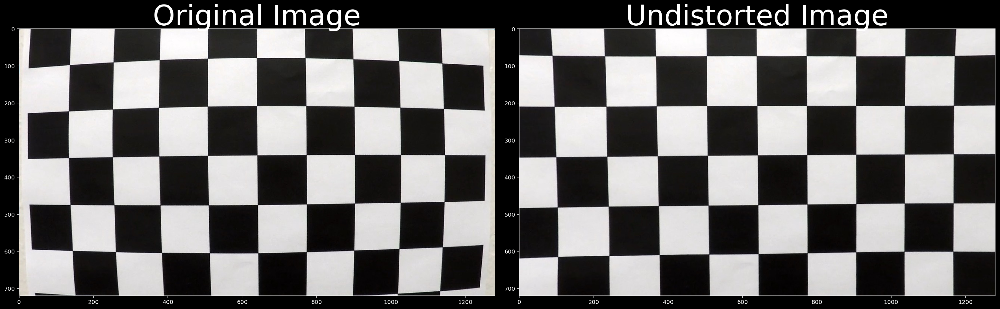

In [5]:
test_img = mpimg.imread('camera_cal/calibration1.jpg')

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistort(test_img))
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

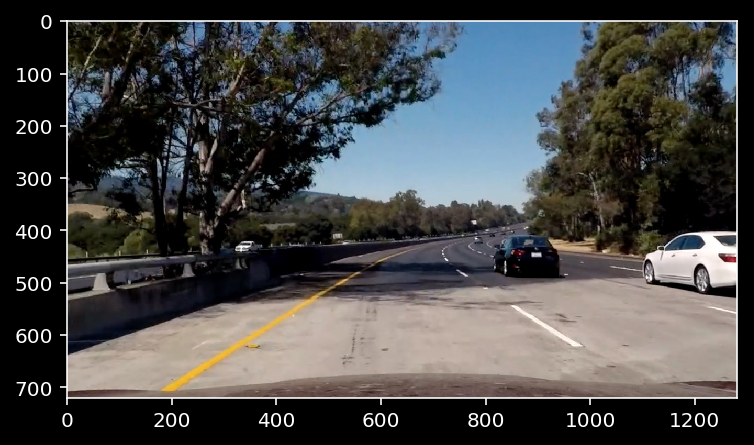

In [6]:
test_img = mpimg.imread('test_images/test5.jpg')
plt.imshow(undistort(test_img))

In [7]:
def hls_select(img, thresh=(170, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output

def sobel_select(img, orient='x', thresh=(20, 100)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    abs_sobel = np.absolute(sobel)
    
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output

def combined_select(img):
    s_binary = hls_select(img)
    sxbinary = sobel_select(img)
    
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

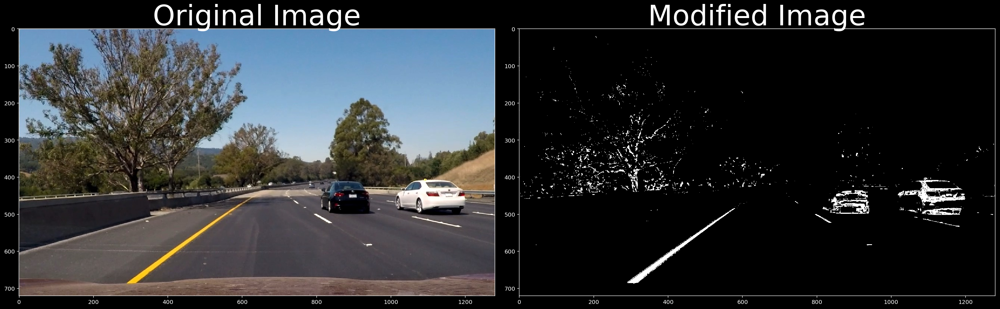

In [8]:
test_img = mpimg.imread('test_images/test6.jpg')

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)

ax2.imshow(hls_select(test_img), cmap='gray')
ax2.set_title('Modified Image', fontsize=50)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [9]:
def define_warp():
    left1 = (170,img_size[0])
    left2 = (591,450)
    right1 = (img_size[1]-left1[0],img_size[0])
    right2 = (img_size[1]-left2[0],left2[1])
    
    offset = 300
    
    warped_left1 = (offset,img_size[0])
    warped_left2 = (offset,0)
    warped_right1 = (img_size[1]-offset,img_size[0])
    warped_right2 = (img_size[1]-offset,0)
    
    src = np.float32([left1, left2, right1, right2])
    dst = np.float32([warped_left1, warped_left2, warped_right1, warped_right2])

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    def warp(img):
        return cv2.warpPerspective(img, M, (1280,720))
    
    def unwarp(img):
        return cv2.warpPerspective(img, Minv, (1280,720))
    
    return warp, unwarp, (left1, left2, right1, right2), (warped_left1, warped_left2, warped_right1, warped_right2)

warp, unwarp, warp_points, warped_points = define_warp()

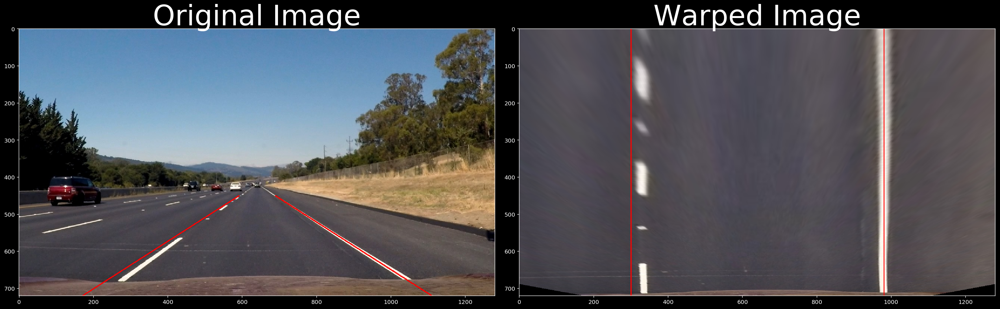

In [10]:
test_img = mpimg.imread('test_images/straight_lines2.jpg')
warped_img = warp(undistort(test_img))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

cv2.line(test_img, warp_points[0], warp_points[1], (255,0,0), thickness=2)
cv2.line(test_img, warp_points[2], warp_points[3], (255,0,0), thickness=2)
ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)

cv2.line(warped_img, warped_points[0], warped_points[1], (255,0,0), thickness=2)
cv2.line(warped_img, warped_points[2], warped_points[3], (255,0,0), thickness=2)
ax2.imshow(warped_img)
ax2.set_title('Warped Image', fontsize=50)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [11]:
class Pipeline:
    def __init__(self):
        self.nwindows = 9
        self.margin = 100
        self.minpix = 50
        self.left_fit = None
        self.right_fit = None
        self.left_deque = deque()
        self.right_deque = deque()
        pass
    
    def next_frame(self, img):
        img = undistort(img)
        warped_img = warp(img)
        binary_img = combined_select(warped_img)
        
        if self.left_deque:
            self.update(binary_img)
        else:
            self.find_lines(binary_img)
            
        self.left_deque.append(self.left_fit)
        if len(self.left_deque) > 10:
            self.left_deque.popleft()
            
        self.right_deque.append(self.right_fit)
        if len(self.right_deque) > 10:
            self.right_deque.popleft()
        
        self.left_fit = np.mean(np.array(self.left_deque), axis=0)
        self.right_fit = np.mean(np.array(self.right_deque), axis=0)
        
        ploty = np.linspace(0, binary_img.shape[0]-1, binary_img.shape[0])
        left_fitx = self.left_fit[0]*ploty**2 + self.left_fit[1]*ploty + self.left_fit[2]
        right_fitx = self.right_fit[0]*ploty**2 + self.right_fit[1]*ploty + self.right_fit[2]
        
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        
        y_eval = np.max(ploty)
        
        left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
        
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
        pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        pts = np.hstack((pts_left, pts_right))

        warp_zero = np.zeros_like(binary_img).astype(np.uint8)
        lane_img = np.dstack((warp_zero, warp_zero, warp_zero))
        
        cv2.fillPoly(lane_img, np.int_([pts]), (0, 255, 0))

        lane_img = unwarp(lane_img)
        
        img = cv2.addWeighted(img, 1, lane_img, 0.3, 0)
        
        text = "Radius of curvature: {:.2f} m".format(np.mean([left_curverad, right_curverad]))
        img = cv2.putText(img, text, (20,40), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2)
        
        m_from_center = xm_per_pix * (1280 - right_fitx[-1] - left_fitx[-1]) / 2
        text = "Vehicle is {:.2f} m {} of center".format(abs(m_from_center), "left" if m_from_center < 0 else "right")
        img = cv2.putText(img, text, (20,80), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2)
        
        return img
        
    def find_lines(self, img):
        histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint
        
        window_height = np.int(img.shape[0] / self.nwindows)
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        leftx_current = leftx_base
        rightx_current = rightx_base
        
        left_lane_inds = []
        right_lane_inds = []
        
        for window in range(self.nwindows):
            win_y_low = img.shape[0] - (window+1)*window_height
            win_y_high = img.shape[0] - window*window_height
            win_xleft_low = leftx_current - self.margin
            win_xleft_high = leftx_current + self.margin
            win_xright_low = rightx_current - self.margin
            win_xright_high = rightx_current + self.margin

            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]

            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            
            if len(good_left_inds) > self.minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > self.minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        self.left_fit = np.polyfit(lefty, leftx, 2)
        self.right_fit = np.polyfit(righty, rightx, 2)
    
    def update(self, img):
        nonzero = img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        
        left_lane_inds = ((nonzerox > (self.left_fit[0]*(nonzeroy**2) + self.left_fit[1]*nonzeroy + self.left_fit[2] - self.margin)) & (nonzerox < (self.left_fit[0]*(nonzeroy**2) + self.left_fit[1]*nonzeroy + self.left_fit[2] + self.margin))) 
        right_lane_inds = ((nonzerox > (self.right_fit[0]*(nonzeroy**2) + self.right_fit[1]*nonzeroy + self.right_fit[2] - self.margin)) & (nonzerox < (self.right_fit[0]*(nonzeroy**2) + self.right_fit[1]*nonzeroy + self.right_fit[2] + self.margin)))  

        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        
        self.left_fit = np.polyfit(lefty, leftx, 2)
        self.right_fit = np.polyfit(righty, rightx, 2)    
        
        return left_lane_inds, right_lane_inds
        

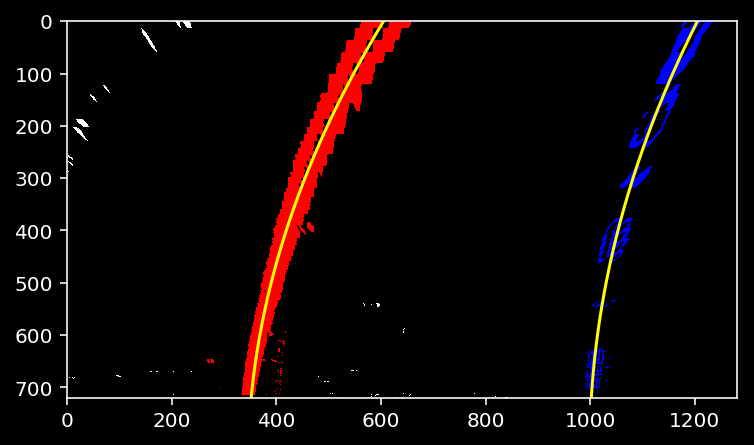

In [12]:
test_img = mpimg.imread('test_images/test3.jpg')

pipeline = Pipeline()
pipeline.next_frame(test_img)

test_img = warp(combined_select(undistort(test_img)))

left_lane_inds, right_lane_inds = pipeline.update(test_img)

ploty = np.linspace(0, test_img.shape[0]-1, test_img.shape[0] )
left_fitx = pipeline.left_fit[0]*ploty**2 + pipeline.left_fit[1]*ploty + pipeline.left_fit[2]
right_fitx = pipeline.right_fit[0]*ploty**2 + pipeline.right_fit[1]*ploty + pipeline.right_fit[2]

nonzero = test_img.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])

out_img = np.dstack((test_img, test_img, test_img))*255
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')

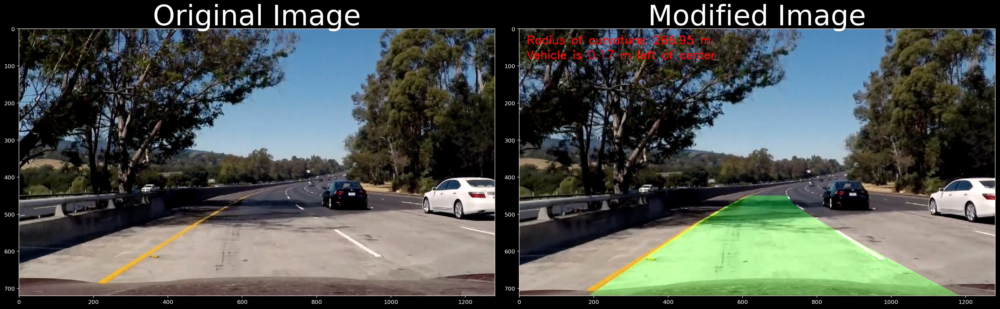

In [13]:
test_img = mpimg.imread('test_images/test5.jpg')

pipeline = Pipeline()
output_img = pipeline.next_frame(test_img)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(test_img)
ax1.set_title('Original Image', fontsize=50)

ax2.imshow(output_img)
ax2.set_title('Modified Image', fontsize=50)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [ ]:
clip = VideoFileClip('project_video.mp4')
pipeline = Pipeline()
clip = clip.fl_image(pipeline.next_frame)
%time clip.write_videofile('output.mp4', audio=False)